In [1]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_retrieval,pairs_from_exhaustive,retrieval

## Setup
In this notebook, we will run SfM reconstruction from scratch on a set of images. We choose the [South-Building dataset](https://openaccess.thecvf.com/content_cvpr_2013/html/Hane_Joint_3D_Scene_2013_CVPR_paper.html) - we will download it later. First, we define some paths.

In [2]:
map_name = 'pavilion-20230314-narrow'
images = Path('/src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/pavilion-20230314-narrow/db')

outputs = Path('PMUC_outputs/pavilion-20230314-narrow/')
sfm_pairs = outputs / 'pairs-netvlad.txt'
sfm_dir = outputs / 'sfm_superpoint+superglue'
feature_path = outputs / 'feats-superpoint-n4096-r1024.h5'
retrieval_path = outputs / 'openibl_4096.h5'
match_path = outputs / "feats-superpoint-n4096-r1024_matches-superglue_pairs-custom_retrieved.h5"
retrieval_conf = extract_features.confs['netvlad']
feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']

## Download the dataset
The dataset is simply a set of images. The intrinsic parameters will be extracted from the EXIF data and refined with SfM.

In [46]:
if not images.exists():
    !wget http://cvg.ethz.ch/research/local-feature-evaluation/South-Building.zip -P datasets/
    !unzip -q datasets/South-Building.zip -d datasets/

## Find image pairs via image retrieval
We extract global descriptors with NetVLAD and find for each image the most similar ones. For smaller dataset we can instead use exhaustive matching via `hloc/pairs_from_exhaustive.py`, which would find $\frac{n(n-1)}{2}$ images pairs.

In [4]:
retrieval_path = extract_features.main(retrieval_conf, images, outputs)
pairs_from_retrieval.main(retrieval_path, sfm_pairs, num_matched=30)

[2023/03/13 06:14:47.132Z hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'glob-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2023/03/13 06:14:47.136Z hloc INFO] Found 64 images in root /src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/pavilion-20230314-narrow/db.
[2023/03/13 06:14:47.137Z hloc INFO] Start delete query feature: PMUC_outputs/pavilion-20230314-narrow/glob-feats-netvlad.h5
[2023/03/13 06:14:47.142Z hloc INFO] Start skip pairs: PMUC_outputs/pavilion-20230314-narrow/glob-feats-netvlad.h5
[2023/03/13 06:14:47.143Z hloc INFO] use default weight for netvlad...
[2023/03/13 06:14:47.144Z hloc INFO] Finished setup model for feature extraction
100%|██████████| 64/64 [00:05<00:00, 11.73it/s]
[2023/03/13 06:14:52.606Z hloc INFO] Finished exporting features.
[2023/03/13 06:14:52.607Z hloc INFO] Extracting image pairs from a retrieval database.
[2023/03/13 06:14:52.703Z hloc INFO] Found 1920 pairs.


In [11]:
import os
pmuc = '/src/matcher_engine/HierarchicalLocalization/PMUC_Dataset'
for map_name in os.listdir(pmuc):
    print(map_name)
    flag = False
    for i in ["bld3", "bld4" , "canteen", "dragon" , "essence", "cuparking", "football", "political"]:
        if i in map_name: 
            flag = True
    if flag:
        images = Path(pmuc) / map_name/ 'db'
        outputs = Path(f'pairs_loc_outputs/{map_name}/')
        sfm_pairs = outputs / 'pairs-netvlad-base.txt'
        sfm_dir = outputs / 'sfm_superpoint+superglue'
        feature_path = outputs / 'feats-superpoint-n4096-r1024.h5'
        retrieval_path = outputs / 'openibl_4096.h5'
        match_path = outputs / "feats-superpoint-n4096-r1024_matches-superglue_pairs-custom_retrieved.h5"
        retrieval_conf = extract_features.confs['netvlad']
        feature_conf = extract_features.confs['superpoint_aachen']
        matcher_conf = match_features.confs['superglue']

        retrieval_path = extract_features.main(retrieval_conf, images, outputs)
        pairs_from_retrieval.main(retrieval_path, sfm_pairs, num_matched=50)

[2023/02/14 07:38:54.422Z hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2023/02/14 07:38:54.430Z hloc INFO] Found 264 images in root /src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/essence-20221103/db.
[2023/02/14 07:38:54.431Z hloc INFO] Start delete query feature: pairs_loc_outputs/essence-20221103/global-feats-netvlad.h5
[2023/02/14 07:38:54.431Z hloc INFO] Start skip pairs: pairs_loc_outputs/essence-20221103/global-feats-netvlad.h5
[2023/02/14 07:38:54.433Z hloc INFO] use default weight for netvlad...
[2023/02/14 07:38:54.434Z hloc INFO] Finished setup model for feature extraction


Files Indexing.xlsx
essence-20221103


100%|██████████| 264/264 [00:18<00:00, 13.97it/s]
[2023/02/14 07:39:13.330Z hloc INFO] Finished exporting features.
[2023/02/14 07:39:13.332Z hloc INFO] Extracting image pairs from a retrieval database.
[2023/02/14 07:39:13.699Z hloc INFO] Found 13200 pairs.
[2023/02/14 07:39:13.704Z hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2023/02/14 07:39:13.712Z hloc INFO] Found 168 images in root /src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/bld3f1-20221106/db.
[2023/02/14 07:39:13.713Z hloc INFO] Start delete query feature: pairs_loc_outputs/bld3f1-20221106/global-feats-netvlad.h5
[2023/02/14 07:39:13.714Z hloc INFO] Start skip pairs: pairs_loc_outputs/bld3f1-20221106/global-feats-netvlad.h5
[2023/02/14 07:39:13.715Z hloc INFO] use default weight for netvlad...
[2023/02/14 07:39:13.716Z hloc INFO] Finished setup model for feature extraction


isl2-test
rename.py
PMUC Place Dataset for submission
bld3f1-20221106


100%|██████████| 168/168 [00:11<00:00, 14.28it/s]
[2023/02/14 07:39:25.482Z hloc INFO] Finished exporting features.
[2023/02/14 07:39:25.483Z hloc INFO] Extracting image pairs from a retrieval database.
[2023/02/14 07:39:25.735Z hloc INFO] Found 8400 pairs.
[2023/02/14 07:39:25.740Z hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2023/02/14 07:39:25.746Z hloc INFO] Found 144 images in root /src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/football-20221106/db.
[2023/02/14 07:39:25.748Z hloc INFO] Start delete query feature: pairs_loc_outputs/football-20221106/global-feats-netvlad.h5
[2023/02/14 07:39:25.748Z hloc INFO] Start skip pairs: pairs_loc_outputs/football-20221106/global-feats-netvlad.h5
[2023/02/14 07:39:25.749Z hloc INFO] use default weight for netvlad...
[2023/02/14 07:39:25.750Z hloc INFO] Finished setup model for feature extraction


shellhut-20221109-backup
shellhut-20221109
split_line.py
football-20221106


100%|██████████| 144/144 [00:10<00:00, 14.35it/s]
[2023/02/14 07:39:35.790Z hloc INFO] Finished exporting features.
[2023/02/14 07:39:35.791Z hloc INFO] Extracting image pairs from a retrieval database.
[2023/02/14 07:39:35.984Z hloc INFO] Found 7200 pairs.
[2023/02/14 07:39:35.988Z hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2023/02/14 07:39:35.992Z hloc INFO] Found 104 images in root /src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/canteen-20221115/db.
[2023/02/14 07:39:35.993Z hloc INFO] Start delete query feature: pairs_loc_outputs/canteen-20221115/global-feats-netvlad.h5
[2023/02/14 07:39:35.994Z hloc INFO] Start skip pairs: pairs_loc_outputs/canteen-20221115/global-feats-netvlad.h5
[2023/02/14 07:39:35.996Z hloc INFO] use default weight for netvlad...
[2023/02/14 07:39:35.996Z hloc INFO] Finished setup model for feature extraction


canteen-20221115


100%|██████████| 104/104 [00:07<00:00, 14.11it/s]
[2023/02/14 07:39:43.368Z hloc INFO] Finished exporting features.
[2023/02/14 07:39:43.370Z hloc INFO] Extracting image pairs from a retrieval database.
[2023/02/14 07:39:43.504Z hloc INFO] Found 5200 pairs.
[2023/02/14 07:39:43.508Z hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2023/02/14 07:39:43.516Z hloc INFO] Found 200 images in root /src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/bld4f1-20221101/db.
[2023/02/14 07:39:43.517Z hloc INFO] Start delete query feature: pairs_loc_outputs/bld4f1-20221101/global-feats-netvlad.h5
[2023/02/14 07:39:43.517Z hloc INFO] Start skip pairs: pairs_loc_outputs/bld4f1-20221101/global-feats-netvlad.h5
[2023/02/14 07:39:43.518Z hloc INFO] use default weight for netvlad...
[2023/02/14 07:39:43.518Z hloc INFO] Finished setup model for feature extraction


isl2-20221101
bld4f1-20221101


100%|██████████| 200/200 [00:14<00:00, 14.01it/s]
[2023/02/14 07:39:57.796Z hloc INFO] Finished exporting features.
[2023/02/14 07:39:57.796Z hloc INFO] Extracting image pairs from a retrieval database.
[2023/02/14 07:39:58.060Z hloc INFO] Found 10000 pairs.
[2023/02/14 07:39:58.074Z hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2023/02/14 07:39:58.090Z hloc INFO] Found 368 images in root /src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/political-20221114/db.
[2023/02/14 07:39:58.091Z hloc INFO] Start delete query feature: pairs_loc_outputs/political-20221114/global-feats-netvlad.h5
[2023/02/14 07:39:58.091Z hloc INFO] Start skip pairs: pairs_loc_outputs/political-20221114/global-feats-netvlad.h5
[2023/02/14 07:39:58.092Z hloc INFO] use default weight for netvlad...
[2023/02/14 07:39:58.093Z hloc INFO] Finished setup model for feature extraction


political-20221114


100%|██████████| 368/368 [00:26<00:00, 13.84it/s]
[2023/02/14 07:40:24.679Z hloc INFO] Finished exporting features.
[2023/02/14 07:40:24.680Z hloc INFO] Extracting image pairs from a retrieval database.
[2023/02/14 07:40:25.157Z hloc INFO] Found 18400 pairs.
[2023/02/14 07:40:25.164Z hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2023/02/14 07:40:25.174Z hloc INFO] Found 296 images in root /src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/dragon-20221115/db.
[2023/02/14 07:40:25.175Z hloc INFO] Start delete query feature: pairs_loc_outputs/dragon-20221115/global-feats-netvlad.h5
[2023/02/14 07:40:25.176Z hloc INFO] Start skip pairs: pairs_loc_outputs/dragon-20221115/global-feats-netvlad.h5
[2023/02/14 07:40:25.177Z hloc INFO] use default weight for netvlad...
[2023/02/14 07:40:25.179Z hloc INFO] Finished setup model for feature extraction


dragon-20221115


100%|██████████| 296/296 [00:25<00:00, 11.72it/s]
[2023/02/14 07:40:50.449Z hloc INFO] Finished exporting features.
[2023/02/14 07:40:50.450Z hloc INFO] Extracting image pairs from a retrieval database.
[2023/02/14 07:40:50.841Z hloc INFO] Found 14800 pairs.
[2023/02/14 07:40:50.847Z hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2023/02/14 07:40:50.852Z hloc INFO] Found 128 images in root /src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/cuparking-20221101/db.
[2023/02/14 07:40:50.853Z hloc INFO] Start delete query feature: pairs_loc_outputs/cuparking-20221101/global-feats-netvlad.h5
[2023/02/14 07:40:50.854Z hloc INFO] Start skip pairs: pairs_loc_outputs/cuparking-20221101/global-feats-netvlad.h5
[2023/02/14 07:40:50.855Z hloc INFO] use default weight for netvlad...
[2023/02/14 07:40:50.857Z hloc INFO] Finished setup model for feature extraction


cuparking-20221101


100%|██████████| 128/128 [00:11<00:00, 11.52it/s]
[2023/02/14 07:41:01.971Z hloc INFO] Finished exporting features.
[2023/02/14 07:41:01.972Z hloc INFO] Extracting image pairs from a retrieval database.
[2023/02/14 07:41:02.159Z hloc INFO] Found 6400 pairs.


In [62]:
# sfm_pairs = outputs / 'pairs-adjacent-places.txt'

In [63]:
# sfm_pairs

PosixPath('outputs/canteen-20221115-adj-place/pairs-adjacent-places.txt')

## Extract and match local features

In [5]:
feature_path = extract_features.main(feature_conf, images, outputs)
match_path = match_features.main(matcher_conf, sfm_pairs, feature_conf['output'], outputs)

[2023/03/13 06:15:05.849Z hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'features',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}
[2023/03/13 06:15:05.853Z hloc INFO] Found 64 images in root /src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/pavilion-20230314-narrow/db.
[2023/03/13 06:15:05.854Z hloc INFO] Start delete query feature: PMUC_outputs/pavilion-20230314-narrow/features.h5
[2023/03/13 06:15:05.855Z hloc INFO] Start skip pairs: PMUC_outputs/pavilion-20230314-narrow/features.h5


Loaded SuperPoint model


[2023/03/13 06:15:05.877Z hloc INFO] Finished setup model for feature extraction
100%|██████████| 64/64 [00:02<00:00, 29.97it/s]
[2023/03/13 06:15:08.016Z hloc INFO] Finished exporting features.
[2023/03/13 06:15:08.019Z hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


[2023/03/13 06:15:08.225Z hloc INFO] Start delete query matching: PMUC_outputs/pavilion-20230314-narrow/features_matches-superglue_pairs-netvlad.h5
[2023/03/13 06:15:08.226Z hloc INFO] Start skip pairs: PMUC_outputs/pavilion-20230314-narrow/features_matches-superglue_pairs-netvlad.h5
[2023/03/13 06:15:08.227Z hloc INFO] Finished setup model for matching
  3%|▎         | 56/1920 [00:09<05:07,  6.06it/s][2023/03/13 06:15:18.096Z hloc INFO] Matching pair: p006-d4-f00157.jpg_p001-d2-f00031.jpg
[2023/03/13 06:15:18.191Z hloc INFO] Matching pair: p006-d4-f00157.jpg_p004-d2-f00103.jpg
  3%|▎         | 60/1920 [00:10<05:04,  6.11it/s][2023/03/13 06:15:18.733Z hloc INFO] Matching pair: p006-d0-f00145.jpg_p007-d0-f00169.jpg
[2023/03/13 06:15:18.809Z hloc INFO] Matching pair: p006-d0-f00145.jpg_p005-d0-f00121.jpg
  3%|▎         | 64/1920 [00:10<04:28,  6.93it/s][2023/03/13 06:15:19.133Z hloc INFO] Matching pair: p006-d0-f00145.jpg_p005-d1-f00124.jpg
[2023/03/13 06:15:19.225Z hloc INFO] Matching p

In [6]:
feature_path

PosixPath('PMUC_outputs/pavilion-20230314-narrow/features.h5')

## 3D reconstruction
Run COLMAP on the features and matches.

In [7]:
import pycolmap
model = reconstruction.main(sfm_dir, images, sfm_pairs, feature_path, match_path, camera_mode=pycolmap.CameraMode.SINGLE)

[2023/03/13 06:21:14.744Z hloc INFO] Creating an empty database...
[2023/03/13 06:21:15.378Z hloc INFO] Importing images into the database...
[2023/03/13 06:21:16.101Z hloc INFO] Importing features into the database...
100%|██████████| 64/64 [00:00<00:00, 2219.37it/s]
[2023/03/13 06:21:16.335Z hloc INFO] Importing matches into the database...
100%|██████████| 1920/1920 [00:00<00:00, 5045.56it/s]
[2023/03/13 06:21:17.278Z hloc INFO] Performing geometric verification of the matches...
[2023/03/13 06:21:19.567Z hloc INFO] Running 3D reconstruction...
[2023/03/13 06:22:54.938Z hloc INFO] Reconstructed 3 model(s).
[2023/03/13 06:22:54.940Z hloc INFO] Largest model is #1 with 29 images.
[2023/03/13 06:22:54.942Z hloc INFO] Reconstruction statistics:
Reconstruction:
	num_reg_images = 29
	num_cameras = 1
	num_points3D = 2449
	num_observations = 7679
	mean_track_length = 3.13557
	mean_observations_per_image = 264.793
	mean_reprojection_error = 1.16533
	num_input_images = 64


In [8]:
model

<Reconstruction 'num_reg_images=29, num_cameras=1, num_points3D=2449, num_observations=7679'>

In [9]:
recon = model
camera = recon.cameras[1]

params = [camera.model_name, camera.width, camera.height] + camera.params_to_string().split(',')
save_ = f"/src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/{map_name}/narrow_estimated_intrinsic.txt"
intrins_param = ' '.join(map(str, params))
with open(str(save_), 'w') as f:
    f.write(intrins_param)

## Visualization
We visualize some of the registered images, and color their keypoint by visibility, track length, or triangulated depth.

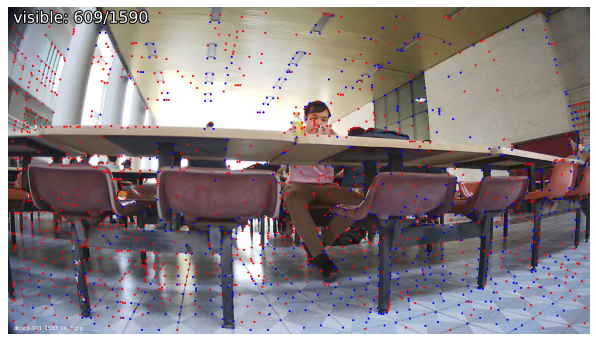

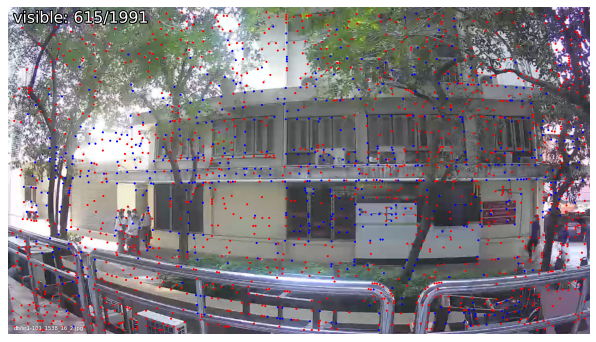

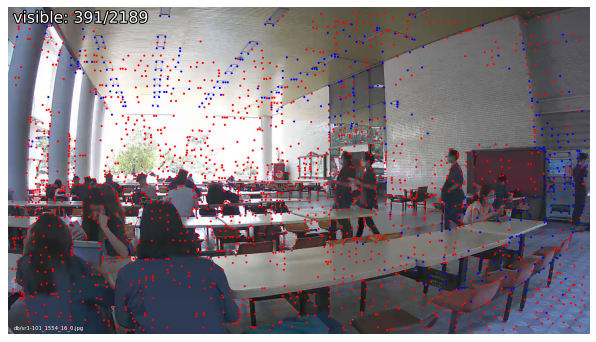

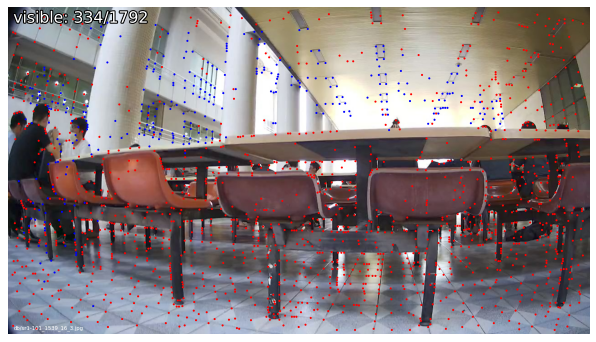

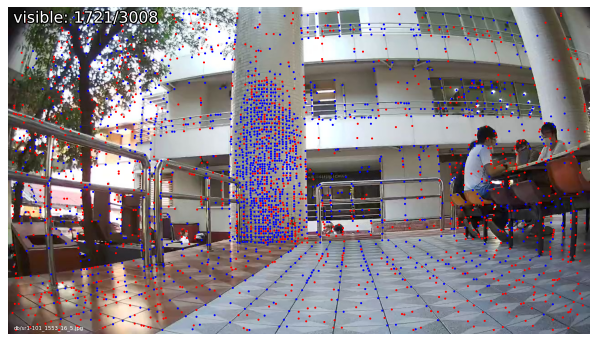

In [11]:
visualization.visualize_sfm_2d(model, images, color_by='visibility', n=5)

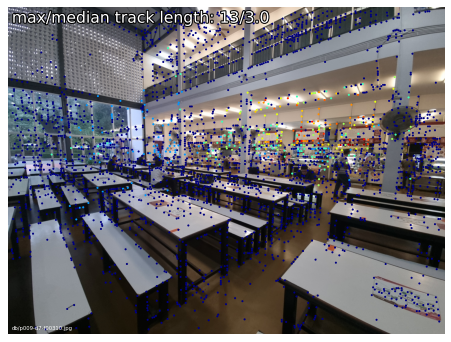

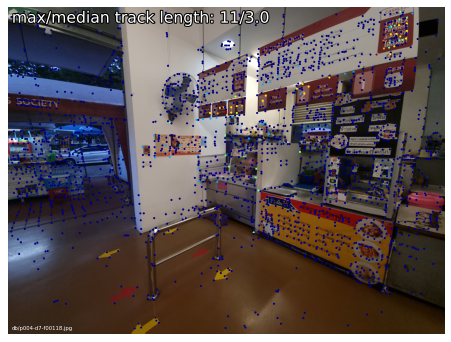

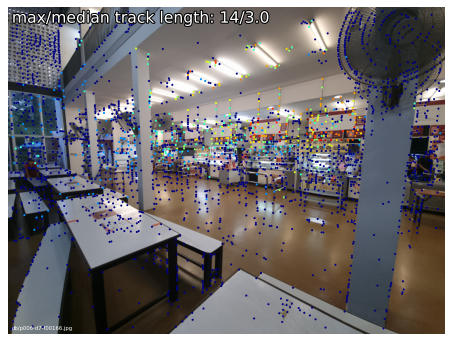

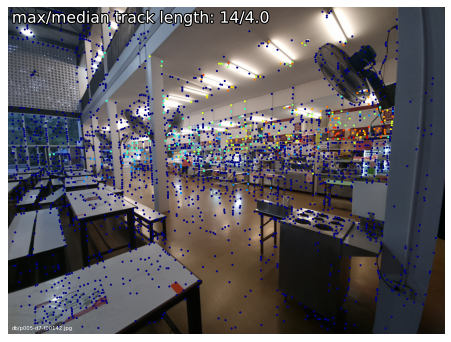

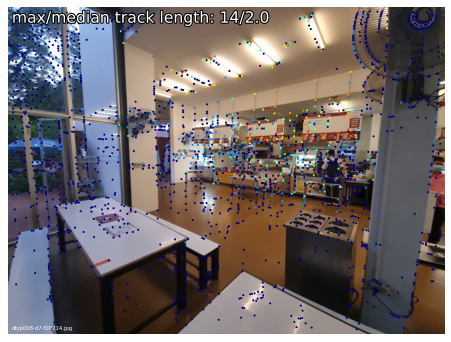

In [24]:
visualization.visualize_sfm_2d(model, images, color_by='track_length', n=5)

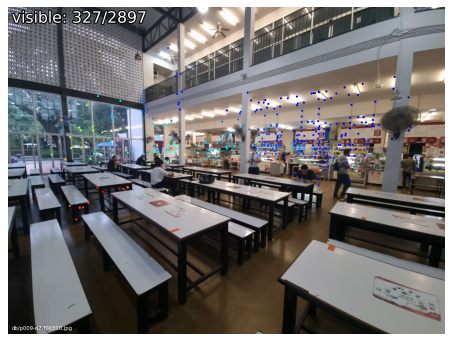

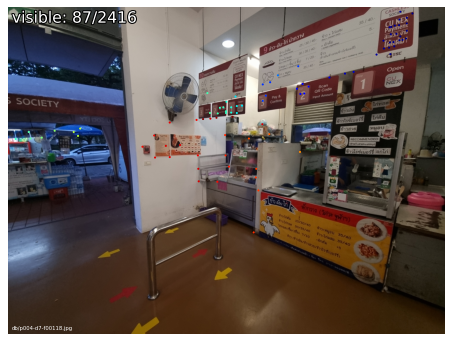

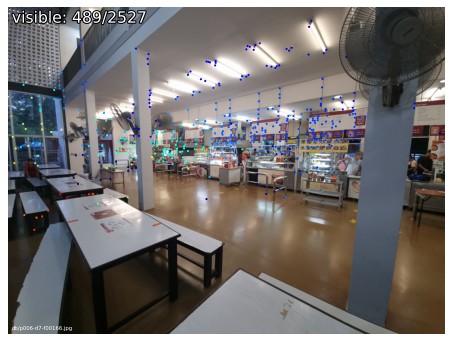

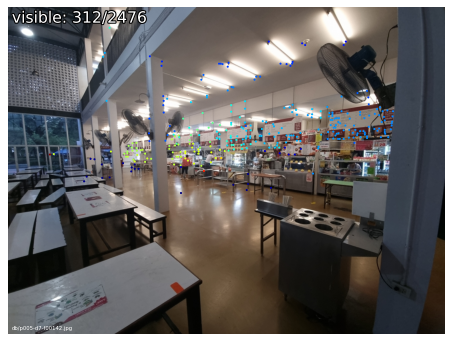

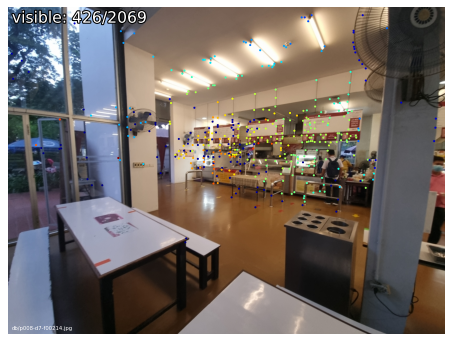

In [25]:
visualization.visualize_sfm_2d(model, images, color_by='depth', n=5)

In [12]:
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

In [ ]:
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping")
fig.show()

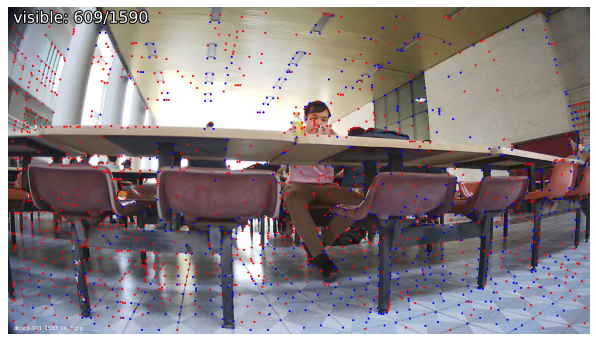

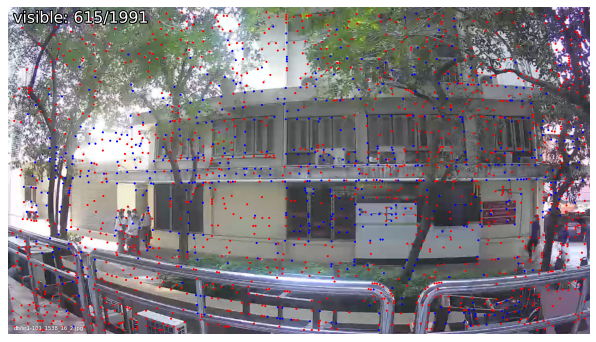

In [14]:
visualization.visualize_sfm_2d(model, images, color_by='visibility', n=2)

## Localizelol

In [15]:
map_name = "isl2-20221101"
sfm_dir = f"/src/matcher_engine/HierarchicalLocalization/PMUC_outputs/{map_name}/weight0/map0"
output_dir = Path(sfm_dir).parent
dataset_dir = f"/src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/{map_name}"
dataset_image_dir = f"/src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/{map_name}/images/"
feature_path = Path(sfm_dir).parent / "features.h5"
match_path = Path(sfm_dir).parent / "features_matches-superglue_pairs-query-netvlad20.h5"

# match_path = Path(sfm_dir).parent / "matches.h5"
retrieval_conf = extract_features.confs['netvlad']
feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']
retrieval_path = Path(sfm_dir).parent / 'glob-des-netvlad.h5'

In [16]:
import pycolmap as pc
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

model = pc.Reconstruction()
model.read(str(sfm_dir))
print(model.summary())

Reconstruction:
	num_reg_images = 48
	num_cameras = 1
	num_points3D = 14002
	num_observations = 56128
	mean_track_length = 4.00857
	mean_observations_per_image = 1169.33
	mean_reprojection_error = 1.30054


cp: '/src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/isl2-20221101/images/query/p005-d4-f00213.jpg' and '/src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/isl2-20221101/images/query/p005-d4-f00213.jpg' are the same file


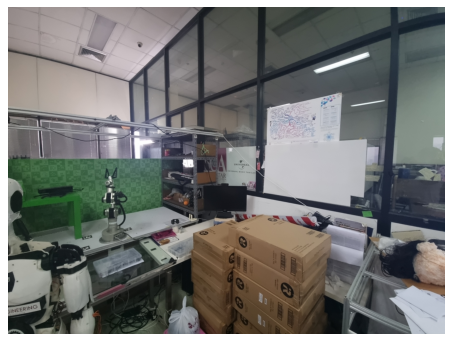

In [18]:
from pathlib import Path
query_path = Path("/src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/isl2-20221101/images")
im_path = 'query/p005-d4-f00213.jpg'
full_im_path = query_path / im_path
!cp {full_im_path} {Path(dataset_dir)/"images"/"query/"}
plot_images([read_image(full_im_path)], dpi=75)

In [21]:
extract_features.main(feature_conf, images, image_list=[im_path], feature_path=feature_path, overwrite=True)

[2023/03/06 05:16:42.930Z hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'features',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}
[2023/03/06 05:16:42.931Z hloc INFO] Start delete query feature: /src/matcher_engine/HierarchicalLocalization/PMUC_outputs/isl2-20221101/weight0/features.h5
[2023/03/06 05:16:42.934Z hloc INFO] Start skip pairs: /src/matcher_engine/HierarchicalLocalization/PMUC_outputs/isl2-20221101/weight0/features.h5
[2023/03/06 05:16:42.935Z hloc INFO] Finished setup model for feature extraction
100%|██████████| 1/1 [00:00<00:00, 17.27it/s]
[2023/03/06 05:16:42.998Z hloc INFO] Finished exporting features.


PosixPath('/src/matcher_engine/HierarchicalLocalization/PMUC_outputs/isl2-20221101/weight0/features.h5')

In [22]:
loc_pairs = Path(sfm_dir).parent / 'pairs-loc.txt'

In [23]:
!ls {retrieval_path}

/src/matcher_engine/HierarchicalLocalization/PMUC_outputs/isl2-20221101/weight0/glob-des-netvlad.h5


In [25]:
dataset_image_dir

'/src/matcher_engine/HierarchicalLocalization/PMUC_Dataset/isl2-20221101/images/'

In [24]:
desc_path = retrieval.main(retrieval.confs["openibl"], dataset_image_dir, output_dir, "glob-des-netvlad.h5")

100%|██████████| 49/49 [00:01<00:00, 32.65it/s]


In [27]:
desc_path

PosixPath('/src/matcher_engine/HierarchicalLocalization/PMUC_outputs/isl2-20221101/weight0/glob-des-netvlad.h5')

In [28]:
references = [i[1].name for i in model.images.items()]
# pairs_from_exhaustive.main(loc_pairs, image_list=[im_path], ref_list=references)
pairs_from_retrieval.main(retrieval_path, loc_pairs, 10, query_list=[im_path], db_prefix="db", query_prefix="q")

references = [i.split(" ")[1] for i in open(loc_pairs, 'r').read().split("\n")]
references

[2023/03/06 05:17:21.523Z hloc INFO] Extracting image pairs from a retrieval database.
[2023/03/06 05:17:21.605Z hloc INFO] Found 10 pairs.


['db/p004-d5-f00127.jpg',
 'db/p001-d1-f00085.jpg',
 'db/p000-d4-f00007.jpg',
 'db/p003-d7-f00118.jpg',
 'db/p005-d4-f00067.jpg',
 'db/p003-d6-f00046.jpg',
 'db/p003-d5-f00115.jpg',
 'db/p000-d3-f00076.jpg',
 'db/p000-d6-f00010.jpg',
 'db/p005-d0-f00061.jpg']

In [29]:
!cat {loc_pairs}

query/p005-d4-f00213.jpg db/p004-d5-f00127.jpg
query/p005-d4-f00213.jpg db/p001-d1-f00085.jpg
query/p005-d4-f00213.jpg db/p000-d4-f00007.jpg
query/p005-d4-f00213.jpg db/p003-d7-f00118.jpg
query/p005-d4-f00213.jpg db/p005-d4-f00067.jpg
query/p005-d4-f00213.jpg db/p003-d6-f00046.jpg
query/p005-d4-f00213.jpg db/p003-d5-f00115.jpg
query/p005-d4-f00213.jpg db/p000-d3-f00076.jpg
query/p005-d4-f00213.jpg db/p000-d6-f00010.jpg
query/p005-d4-f00213.jpg db/p005-d0-f00061.jpg

In [98]:
def remove_image_from_pairs(db_im_names, inverse=False):
    fd = open(loc_pairs, 'r')
    txt = list(fd.read().split("\n"))
    fd.close()
    new_txt = []
    query_name = txt[0].split(" ")[0]
    for im_name in db_im_names:
        if inverse:
            new_txt.append(f"{query_name} {im_name}")        
        else: 
            txt = list(filter(lambda x: im_name not in x, txt))
    if inverse: txt = new_txt
    references = [i.split(" ")[1] for i in txt]
    file_to_write = '\n'.join(txt)
    print("writing...", file_to_write)
    fd = open(loc_pairs, "w", encoding="utf-8")
    fd.write(file_to_write)
    print("write success!")
    return references

# references = remove_image_from_pairs(["db/p010-d1-f00220.jpg",
# "db/p007-d2-f00175.jpg",
# "db/p010-d0-f00217.jpg",
# "db/p006-d1-f00148.jpg",
# "db/p009-d1-f00292.jpg",
# "db/p009-d0-f00289.jpg",
# "db/p010-d2-f00223.jpg",
# "db/p006-d2-f00151.jpg",
# "db/p006-d0-f00145.jpg",
# "db/p001-d2-f00031.jpg",
# "db/p007-d1-f00172.jpg",
# "db/p002-d2-f00055.jpg",
# "db/p007-d0-f00169.jpg",
# "db/p005-d1-f00124.jpg",
# "db/p000-d0-f00001.jpg",
# # "db/p005-d5-f00136.jpg", #bad

# references = remove_image_from_pairs([
# "db/p002-d0-f00049.jpg",
# "db/p002-d1-f00052.jpg",
# "db/p002-d7-f00070.jpg",
# "db/p001-d0-f00025.jpg", #Bad posse
# "db/p001-d1-f00028.jpg",
# # "db/p001-d7-f00046.jpg",
# # "db/p003-d0-f00073.jpg",
# # "db/p003-d1-f00076.jpg",
# # "db/p008-d0-f00193.jpg",
# # "db/p007-d7-f00190.jpg",
# # "db/p003-d7-f00094.jpg",
# # "db/p007-d0-f00169.jpg",
# # "db/p000-d1-f00004.jpg",
# # "db/p000-d7-f00022.jpg",
# # "db/p006-d0-f00145.jpg",
# # "db/p010-d0-f00217.jpg",
# # "db/p000-d0-f00001.jpg",
# # "db/p006-d7-f00166.jpg",
# # "db/p008-d7-f00214.jpg",
# # "db/p009-d0-f00289.jpg",
# # "db/p007-d1-f00172.jpg",
# ],  inverse=True)

In [182]:
' '.join(references)

'db/p001-d0-f00025.jpg db/p000-d0-f00001.jpg db/p003-d0-f00073.jpg db/p007-d0-f00169.jpg db/p003-d4-f00085.jpg db/p002-d1-f00052.jpg db/p001-d1-f00028.jpg db/p004-d4-f00109.jpg db/p002-d7-f00070.jpg db/p002-d4-f00061.jpg'

In [64]:
feature_path

PosixPath('/src/matcher_engine/HierarchicalLocalization/PMUC_outputs/isl2-20221101/weight0/features.h5')

In [100]:
match_path

PosixPath('/src/matcher_engine/HierarchicalLocalization/PMUC_outputs/isl2-20221101/weight0/features_matches-superglue_pairs-query-netvlad20.h5')

In [30]:
match_features.main(matcher_conf, loc_pairs, features=feature_path, matches=match_path, overwrite=True);

[2023/03/06 05:17:42.652Z hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


[2023/03/06 05:17:42.857Z hloc INFO] Start delete query matching: /src/matcher_engine/HierarchicalLocalization/PMUC_outputs/isl2-20221101/weight0/features_matches-superglue_pairs-query-netvlad20.h5
[2023/03/06 05:17:42.858Z hloc INFO] Start skip pairs: /src/matcher_engine/HierarchicalLocalization/PMUC_outputs/isl2-20221101/weight0/features_matches-superglue_pairs-query-netvlad20.h5
[2023/03/06 05:17:42.858Z hloc INFO] Finished setup model for matching
100%|██████████| 10/10 [00:02<00:00,  3.83it/s]
[2023/03/06 05:17:45.469Z hloc INFO] Finished exporting matches.


found 101/985 inlier correspondences.


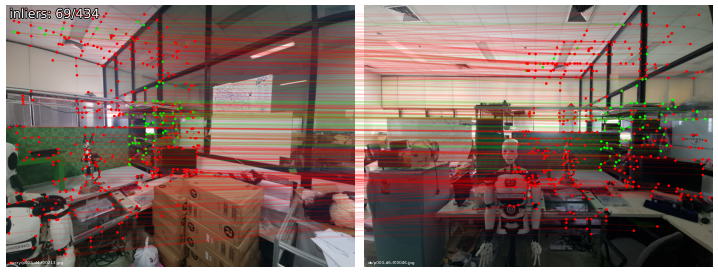

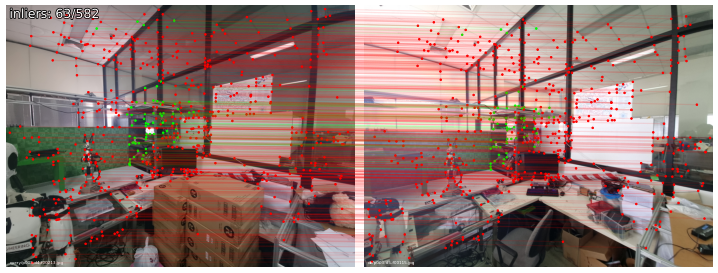

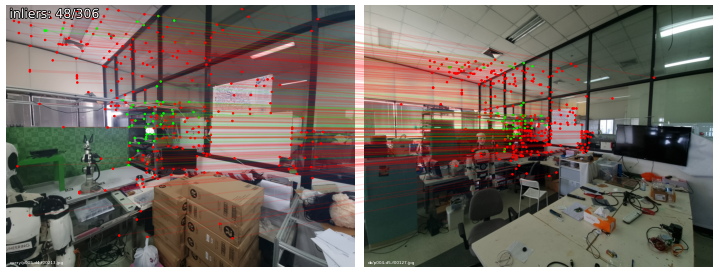

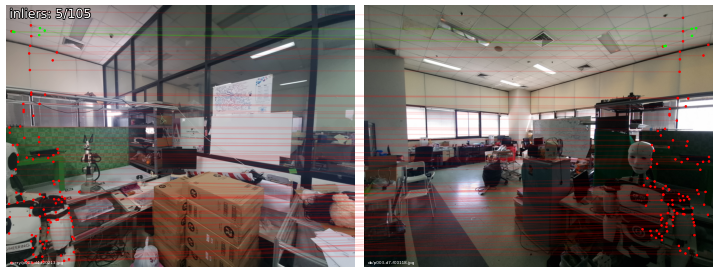

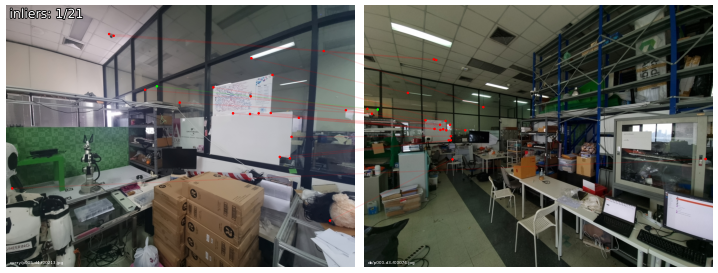

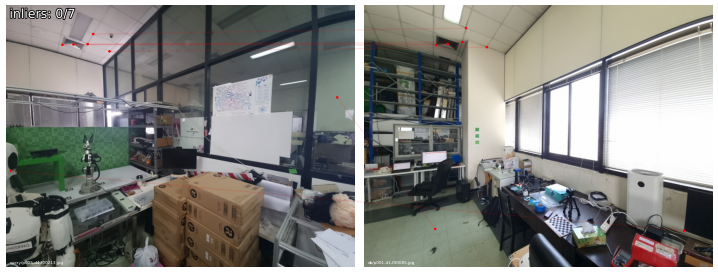

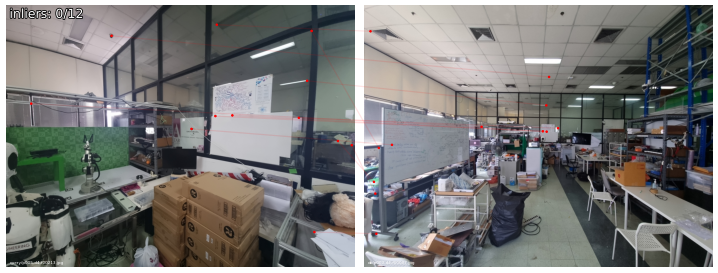

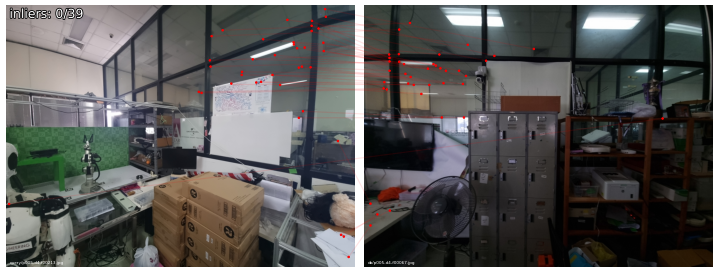

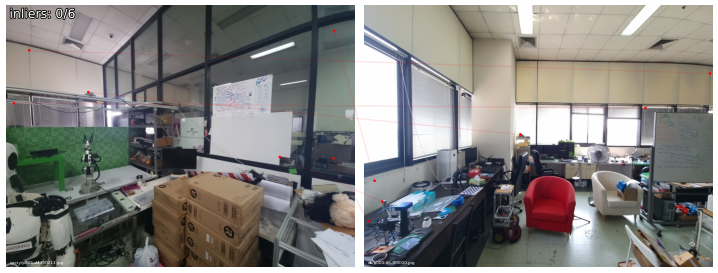

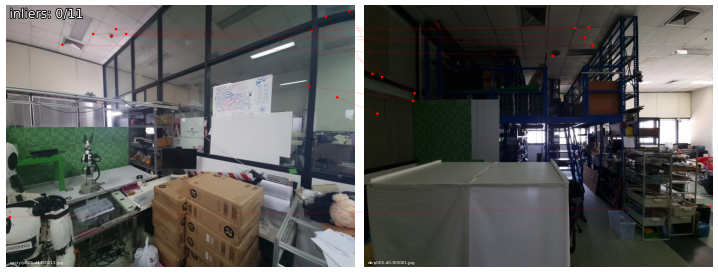

In [31]:
import pycolmap
from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

camera = pycolmap.infer_camera_from_image(full_im_path)
ref_ids = [model.find_image_with_name(r).image_id for r in references]
conf = {
    'estimation': {'ransac': {'max_error': 5, 
                              'min_num_trials':1000, 
                              'max_num_trials':100000, 
                              # 'min_inlier_ratio':0.1, 
                              # 'confidence':0.1
                             }
                  },
    'refinement': {'refine_focal_length': True, 'refine_extra_params': True},
}
localizer = QueryLocalizer(model, conf)
ret, log = pose_from_cluster(localizer, im_path, camera, ref_ids, feature_path, match_path)

print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')
visualization.visualize_loc_from_log(images, im_path, log, model, top_k_db=10, dpi=60)

In [33]:
camera

<Camera 'camera_id=Invalid, model=SIMPLE_RADIAL, width=1008, height=756, num_params=4'>

In [32]:
ret
# log

{'success': True,
 'qvec': array([-0.28676843, -0.29766831,  0.66245873, -0.62474465]),
 'tvec': array([-5.76628286,  0.13221459, -1.35323313]),
 'num_inliers': 101,
 'inliers': [False,
  False,
  False,
  False,
  False,
  False,
  False,
  True,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  True,
  False,
  True,
  False,
  False,
  False,
  False,
  False,
  True,
  False,
  False,
  False,
  False,
  True,
  True,
  False,
  False,
  True,
  True,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  F

In [85]:
pose = pycolmap.Image(tvec=ret['tvec'], qvec=ret['qvec'])
viz_3d.plot_camera_colmap(fig, pose, camera, color='rgba(0,255,0,0.5)', name=im_path)
fig.show()

NameError: name 'fig' is not defined

In [198]:
im_path

'db/p002-d0-f00049.jpg'

In [ ]:
pose

In [ ]:
image_obj = model.find_image_with_name(im_path)
print(image_obj)
print(image_obj.tvec, image_obj.qvec)


In [ ]:
ret

In [ ]:
ret

In [ ]:
model